In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import seaborn as sns

from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve

from sklearn.preprocessing import StandardScaler

In [2]:
df = pd.read_csv('DrugAddictioninBangladesh_Smoted.csv')
df.head()

,Age,Gender,Education,Live with,Motive about drug,Spend most time,Failure in life,Mental/emotional problem,Suicidal thoughts,Family relationship,...,Withdrawal symptoms,Satisfied with workplace,Case in court,Living with drug user,Smoking,Ever taken drug,Friends influence,If chance given to taste drugs,Easy to control use of drug,Class
0,2.0,1.0,4.0,2.0,1.0,3.0,1.0,1.0,1.0,1.0,...,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,2
1,2.0,1.0,3.0,1.0,3.0,2.0,1.0,1.0,2.0,1.0,...,1.0,2.0,2.0,2.0,1.0,1.0,1.0,3.0,1.0,3
2,1.0,1.0,3.0,1.0,1.0,2.0,1.0,1.0,1.0,2.0,...,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2
3,2.0,1.0,4.0,1.0,2.0,2.0,1.0,1.0,2.0,2.0,...,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,2
4,2.0,1.0,4.0,1.0,2.0,3.0,2.0,1.0,2.0,1.0,...,1.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,4


In [3]:
df.Class.value_counts()

2    110
3    110
4    110
1    110
Name: Class, dtype: int64

<AxesSubplot:xlabel='Class', ylabel='count'>

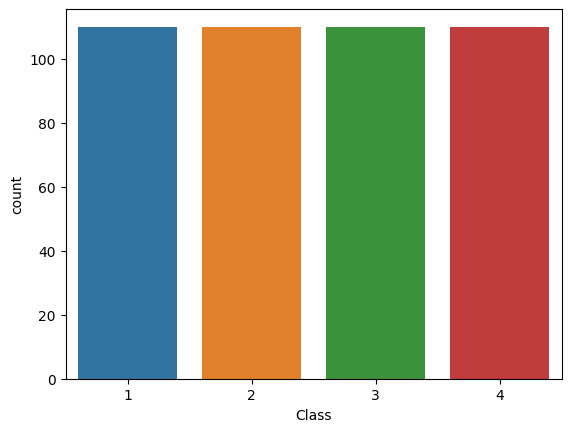

In [4]:
sns.countplot(x = 'Class', data = df)

<AxesSubplot:xlabel='Failure in life', ylabel='count'>

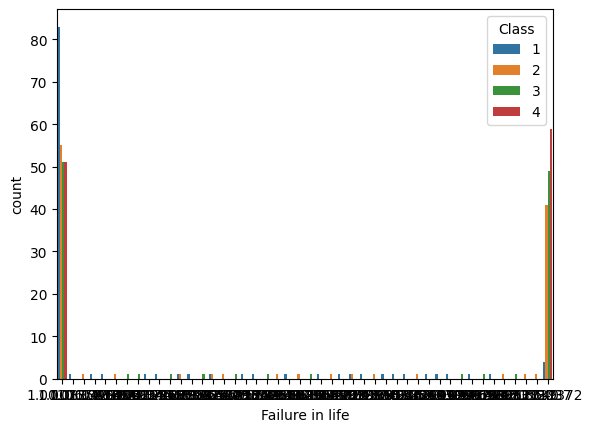

In [5]:
sns.countplot( hue = 'Class', data = df, x = 'Failure in life' )

<AxesSubplot:xlabel='Smoking', ylabel='count'>

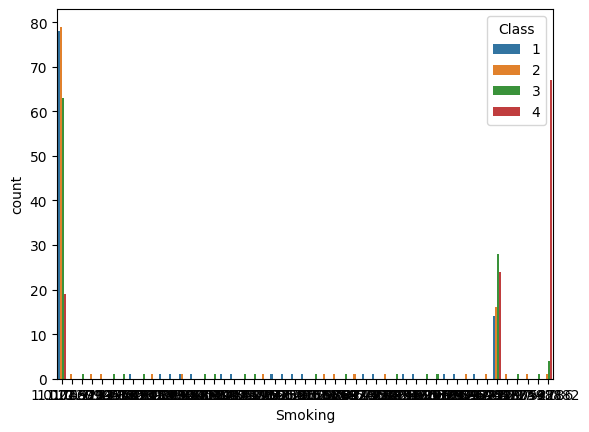

In [6]:
sns.countplot( hue = 'Class', data = df, x = 'Smoking' )

<AxesSubplot:xlabel='Smoking', ylabel='count'>

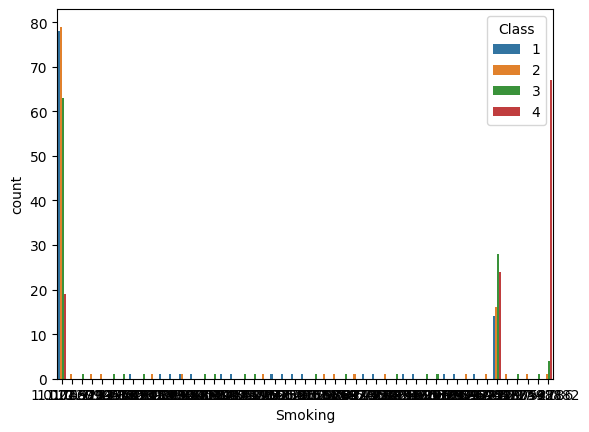

In [7]:
sns.countplot( hue = 'Class', data = df, x = 'Smoking' )

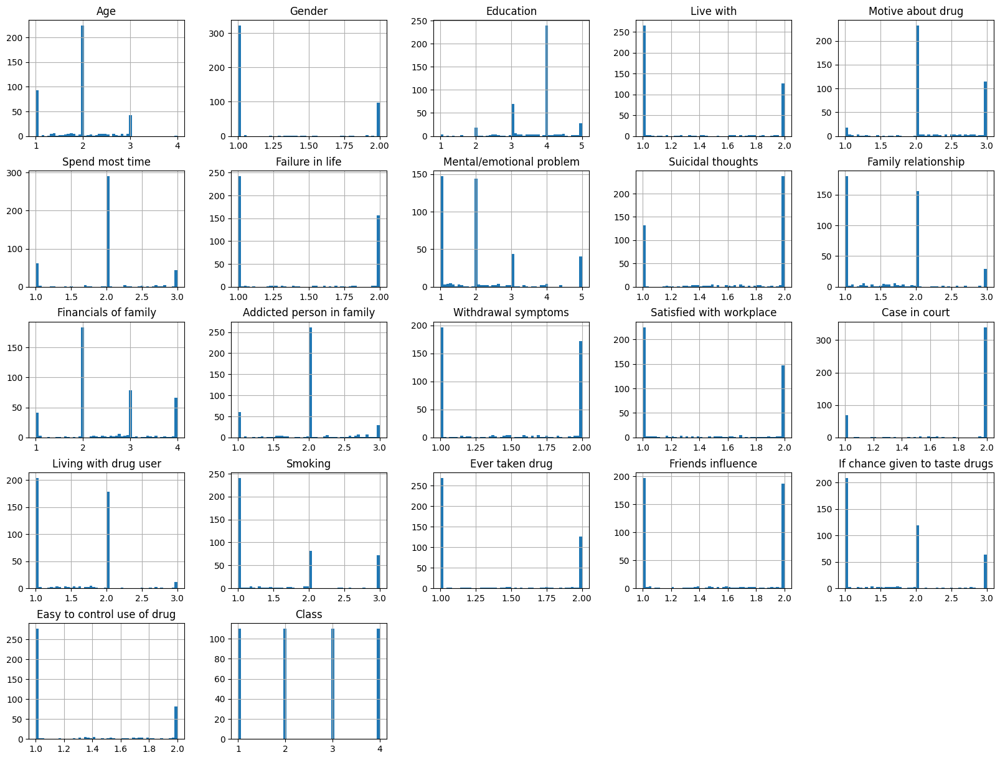

In [8]:
df.hist(bins=50, figsize=(20,15)) 
plt.show()

In [9]:
X = df.drop(['Class'],axis=1)
X.head()

,Age,Gender,Education,Live with,Motive about drug,Spend most time,Failure in life,Mental/emotional problem,Suicidal thoughts,Family relationship,...,Addicted person in family,Withdrawal symptoms,Satisfied with workplace,Case in court,Living with drug user,Smoking,Ever taken drug,Friends influence,If chance given to taste drugs,Easy to control use of drug
0,2.0,1.0,4.0,2.0,1.0,3.0,1.0,1.0,1.0,1.0,...,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0
1,2.0,1.0,3.0,1.0,3.0,2.0,1.0,1.0,2.0,1.0,...,2.0,1.0,2.0,2.0,2.0,1.0,1.0,1.0,3.0,1.0
2,1.0,1.0,3.0,1.0,1.0,2.0,1.0,1.0,1.0,2.0,...,2.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0
3,2.0,1.0,4.0,1.0,2.0,2.0,1.0,1.0,2.0,2.0,...,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0
4,2.0,1.0,4.0,1.0,2.0,3.0,2.0,1.0,2.0,1.0,...,2.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0


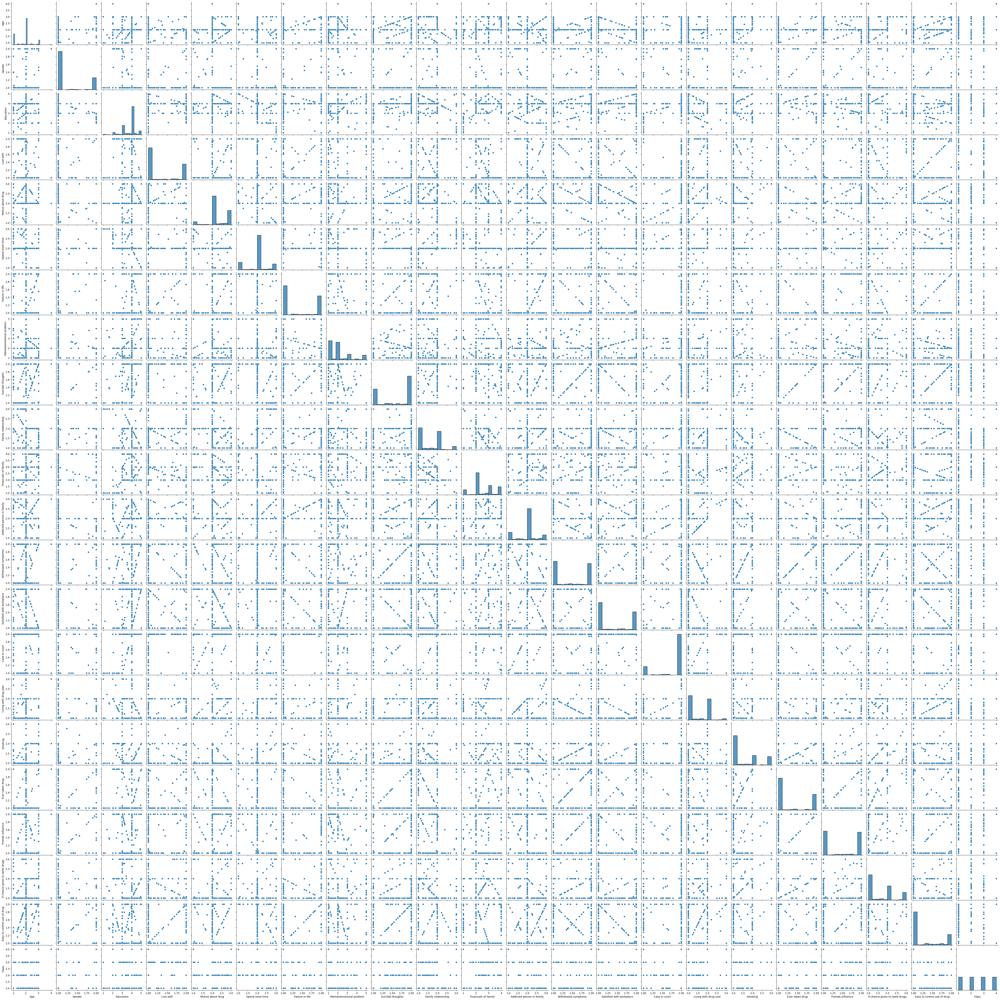

In [10]:
sns.pairplot(df)

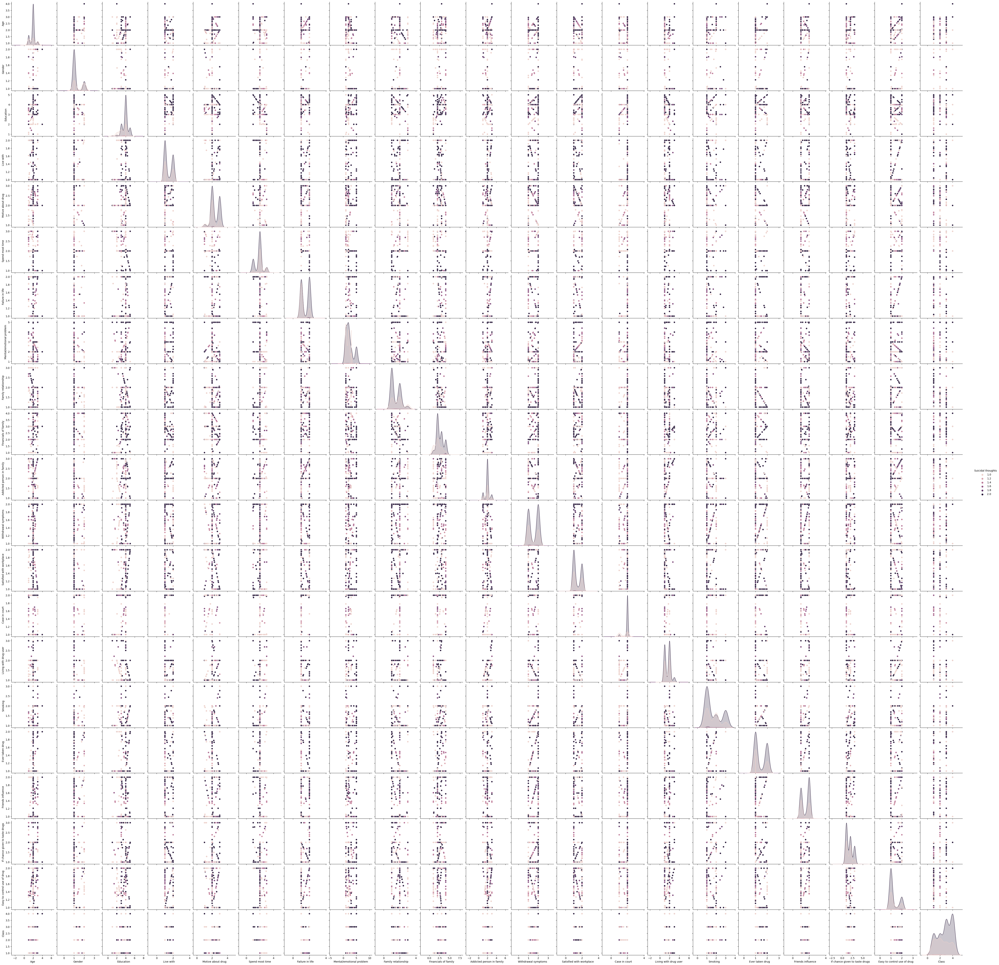

In [11]:
sns.pairplot(df,hue = 'Suicidal thoughts')

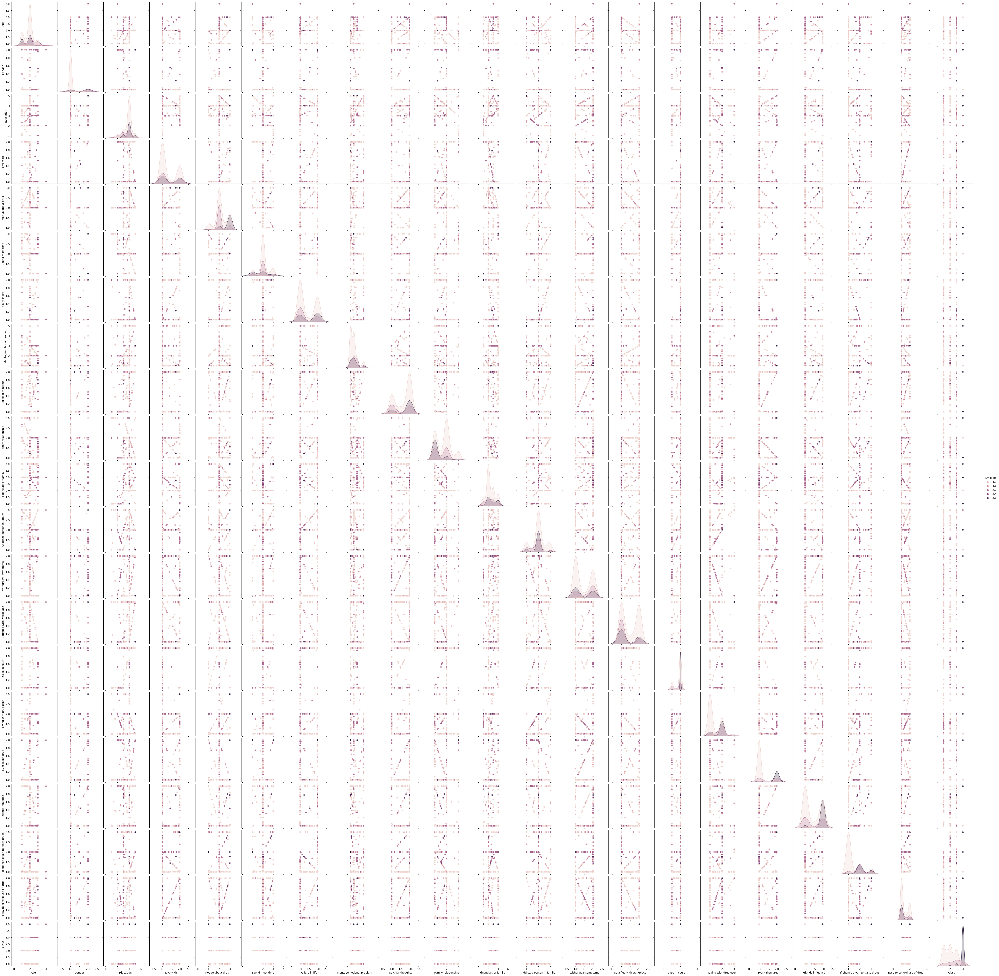

In [12]:
sns.pairplot(df,hue = 'Smoking')

In [13]:
y = df.Class
y.head()

0    2
1    3
2    2
3    2
4    4
Name: Class, dtype: int64

In [14]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.5,random_state=2,stratify=y)

train_0, train_1 = len(y_train[y_train==0]), len(y_train[y_train==1])
test_0, test_1 = len(y_test[y_test==0]), len(y_test[y_test==1])
print('>Train: 0=%d, 1=%d, Test: 0=%d, 1=%d' % (train_0, train_1, test_0, test_1))

>Train: 0=0, 1=55, Test: 0=0, 1=55


In [15]:
X_train.shape

(220, 21)

In [16]:
X_test.shape

(220, 21)

In [17]:
tr_score = list() #train
te_score = list() #test

In [18]:
tree_depths = [i for i in range(1,23)]

In [19]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

In [20]:
for i in tree_depths:
    
    decition_tree_model = DecisionTreeClassifier(max_depth=i) #build model
    
    decition_tree_model.fit(X_train,y_train) #train our ML model
    
    #training data
    train_pred = decition_tree_model.predict(X_train)
    train_ac = accuracy_score(y_train,train_pred)
    tr_score.append(train_ac)
    
    #testing data
    test_pred = decition_tree_model.predict(X_test)
    test_ac = accuracy_score(y_test,test_pred)
    te_score.append(test_ac)
    
    print('Depth = %d, train score= %f, test score = %f' % (i,train_ac,test_ac))

Depth = 1, train score= 0.477273, test score = 0.477273
Depth = 2, train score= 0.609091, test score = 0.563636
Depth = 3, train score= 0.654545, test score = 0.613636
Depth = 4, train score= 0.790909, test score = 0.631818
Depth = 5, train score= 0.877273, test score = 0.713636
Depth = 6, train score= 0.940909, test score = 0.718182
Depth = 7, train score= 0.981818, test score = 0.709091
Depth = 8, train score= 0.990909, test score = 0.722727
Depth = 9, train score= 0.995455, test score = 0.713636
Depth = 10, train score= 1.000000, test score = 0.754545
Depth = 11, train score= 1.000000, test score = 0.772727
Depth = 12, train score= 1.000000, test score = 0.736364
Depth = 13, train score= 1.000000, test score = 0.754545
Depth = 14, train score= 1.000000, test score = 0.731818
Depth = 15, train score= 1.000000, test score = 0.754545
Depth = 16, train score= 1.000000, test score = 0.754545
Depth = 17, train score= 1.000000, test score = 0.727273
Depth = 18, train score= 1.000000, test 

In [21]:
from matplotlib import pyplot as py

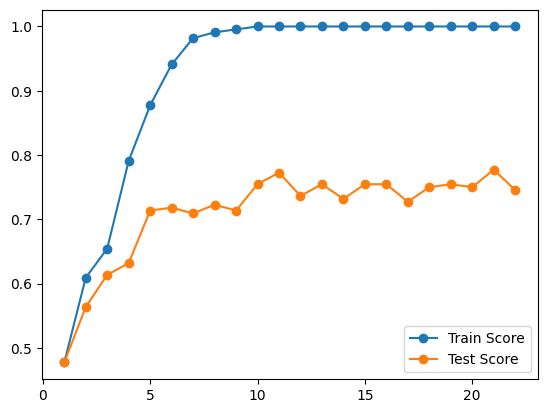

In [22]:
py.plot(tree_depths, tr_score, '-o', label='Train Score')
py.plot(tree_depths, te_score, '-o', label='Test Score')

py.legend()
py.show()

In [23]:
from sklearn.ensemble import ExtraTreesClassifier # Decison tree

In [24]:
extr = ExtraTreesClassifier()

In [25]:
extr.fit(X,y)

ExtraTreesClassifier()

In [26]:

feature_importance = extr.feature_importances_
feature_importance

array([0.04373711, 0.02226967, 0.03521551, 0.02771452, 0.05243977,
       0.03185616, 0.04331038, 0.04916645, 0.04190079, 0.04944062,
       0.05807224, 0.03121922, 0.04294194, 0.04182251, 0.03824996,
       0.05606651, 0.07458621, 0.1219209 , 0.0465763 , 0.04819595,
       0.04329729])

In [27]:
imp = pd.DataFrame(feature_importance, columns=['Gain_Score'])
imp.head()

,Gain_Score
0,0.043737
1,0.022270
2,0.035216
3,0.027715
4,0.052440


In [28]:
X.columns

Index(['Age', 'Gender', 'Education', 'Live with', 'Motive about drug',
       'Spend most time', 'Failure in life', 'Mental/emotional problem',
       'Suicidal thoughts', 'Family relationship', 'Financials of family',
       'Addicted person in family', 'Withdrawal symptoms',
       'Satisfied with workplace', 'Case in court', 'Living with drug user',
       'Smoking', 'Ever taken drug', 'Friends influence',
       'If chance given to taste drugs', 'Easy to control use of drug'],
      dtype='object')

In [29]:
cols = pd.DataFrame(X.columns, columns=['Feature_Names'])
cols.head()

,Feature_Names
0,Age
1,Gender
2,Education
3,Live with
4,Motive about drug


In [30]:
frame = pd.concat([cols,imp],axis=1)
frame

,Feature_Names,Gain_Score
0,Age,0.043737
1,Gender,0.022270
2,Education,0.035216
3,Live with,0.027715
4,Motive about drug,0.052440
5,Spend most time,0.031856
6,Failure in life,0.043310
7,Mental/emotional problem,0.049166
8,Suicidal thoughts,0.041901
9,Family relationship,0.049441


In [31]:
frame.nlargest(21,'Gain_Score')

,Feature_Names,Gain_Score
17,Ever taken drug,0.121921
16,Smoking,0.074586
10,Financials of family,0.058072
15,Living with drug user,0.056067
4,Motive about drug,0.052440
9,Family relationship,0.049441
7,Mental/emotional problem,0.049166
19,If chance given to taste drugs,0.048196
18,Friends influence,0.046576
0,Age,0.043737


In [32]:
newx = frame.nlargest(21,'Gain_Score')
newx

,Feature_Names,Gain_Score
17,Ever taken drug,0.121921
16,Smoking,0.074586
10,Financials of family,0.058072
15,Living with drug user,0.056067
4,Motive about drug,0.052440
9,Family relationship,0.049441
7,Mental/emotional problem,0.049166
19,If chance given to taste drugs,0.048196
18,Friends influence,0.046576
0,Age,0.043737


<AxesSubplot:>

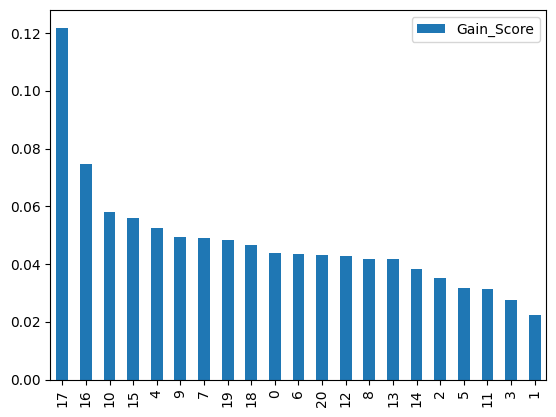

In [33]:
newx.plot(kind='bar')

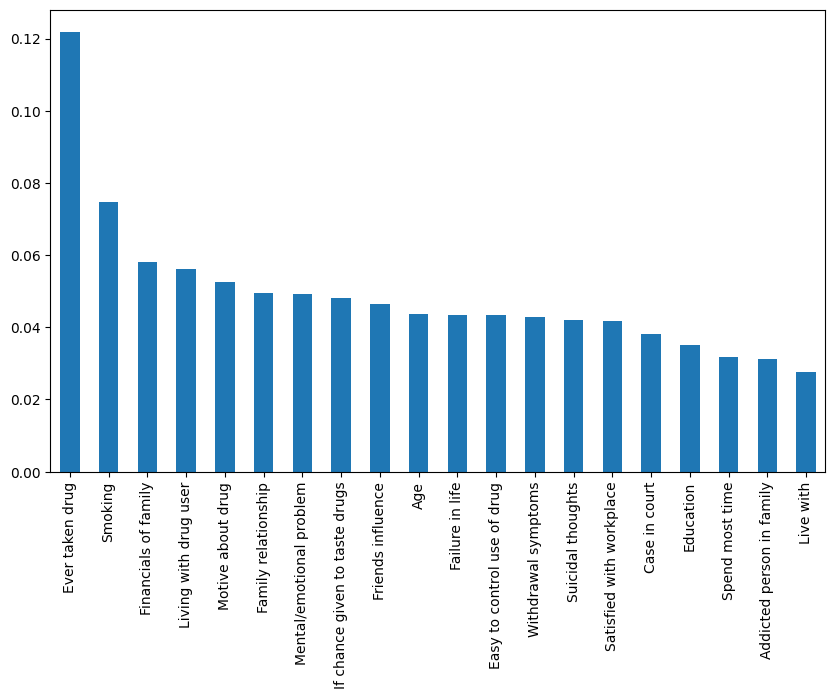

In [34]:
features = pd.Series(extr.feature_importances_, index = X.columns)
plt.figure(figsize=(10,6))
features.nlargest(20).plot(kind='bar')
plt.savefig('score1.png')

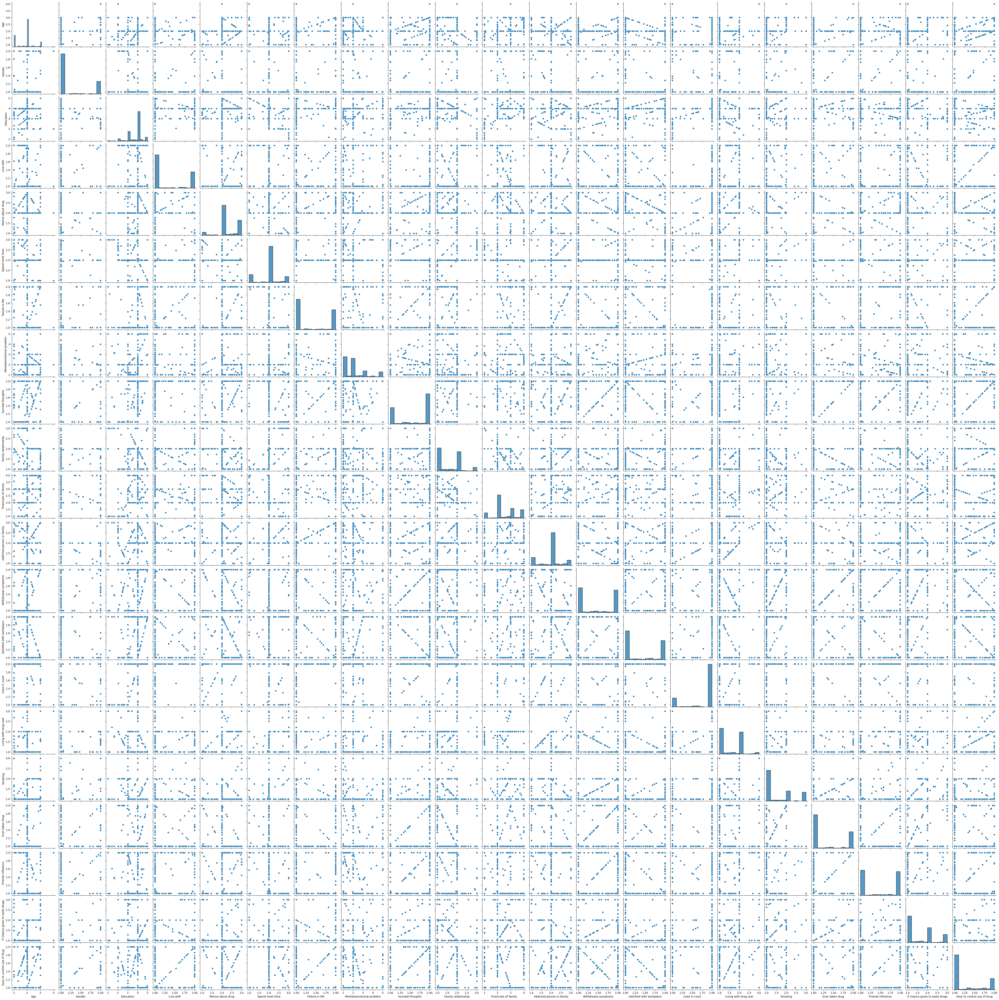

In [35]:
sns.pairplot(X)

<AxesSubplot:>

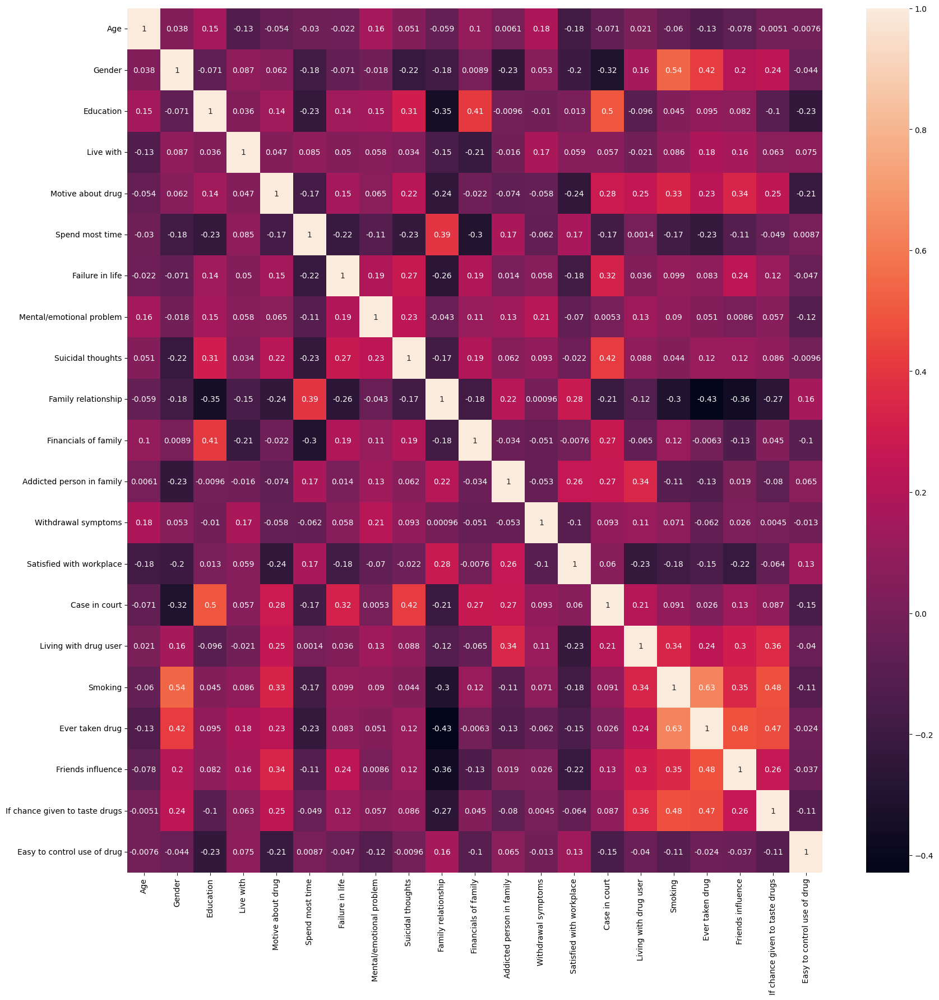

In [36]:
#feature_names = x.columns #features name
colname = X.corr().index #features name
plt.figure(figsize=(20,20))
sns.heatmap(df[colname].corr(),annot=True)

Model 01:- Support Vector Machine (SVM)¶

In [37]:
model=SVC()
model.fit(X_train,y_train)
print(f' Training Accuracy is:- {model.score(X_train,y_train)}')
f'Test Accuracy is:- {model.score(X_test,y_test)}'

 Training Accuracy is:- 0.9318181818181818


'Test Accuracy is:- 0.8227272727272728'

In [38]:
model.score(X,y)

0.8772727272727273

Model 02:- KNN without Hyper parameter tuning


 Best Test accuracy is:-  0.8909090909090909


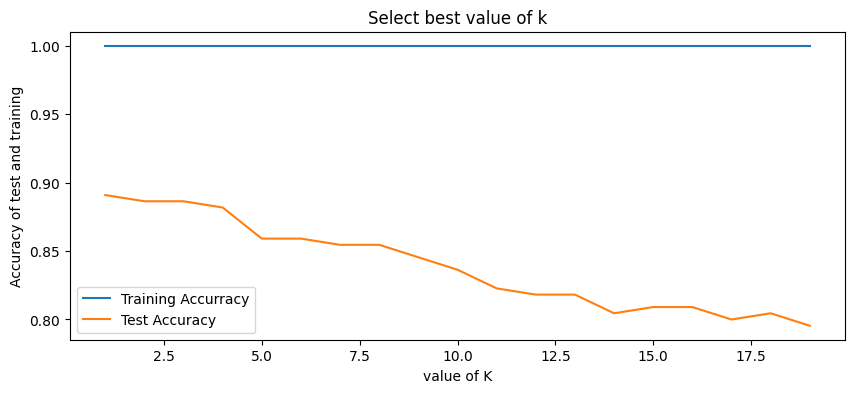

In [39]:
k = range(1,20)
trainingAccuracy = []
testAccuracy=[]
for i in k:
    knn = KNeighborsClassifier(n_neighbors=i,n_jobs=15,p=1,weights='distance')
    knn.fit(X_train,y_train)
    trainingacc = knn.score(X_train,y_train)
    trainingAccuracy.append(trainingacc)
    testAccuracy.append(knn.score(X_test,y_test))

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10,4))
plt.xlabel("value of K")
plt.ylabel("Accuracy of test and training")
plt.title("Select best value of k")
plt.plot(k,trainingAccuracy)
plt.plot(k,testAccuracy)
  #axes[0].legend(['loss','val_loss'])
axes.legend(["Training Accurracy","Test Accuracy"])
print("\n Best Test accuracy is:- ",max(testAccuracy))

Model 02:- Confusion Matrix

3. Logistic regression

In [42]:
from sklearn.linear_model import LogisticRegression
log_model = LogisticRegression(solver='lbfgs', max_iter=1000)

log_model.fit(X_train, y_train)

print(f' Training Accuracy {log_model.score(X_train,y_train)}')
f'Test Accuracy {log_model.score(X_test,y_test)}'

 Training Accuracy 0.8681818181818182


'Test Accuracy 0.7636363636363637'

In [43]:
log_model.score(X,y)

0.8159090909090909

In [44]:
clf = DecisionTreeClassifier()

In [45]:
clf.fit(X,y)

DecisionTreeClassifier()

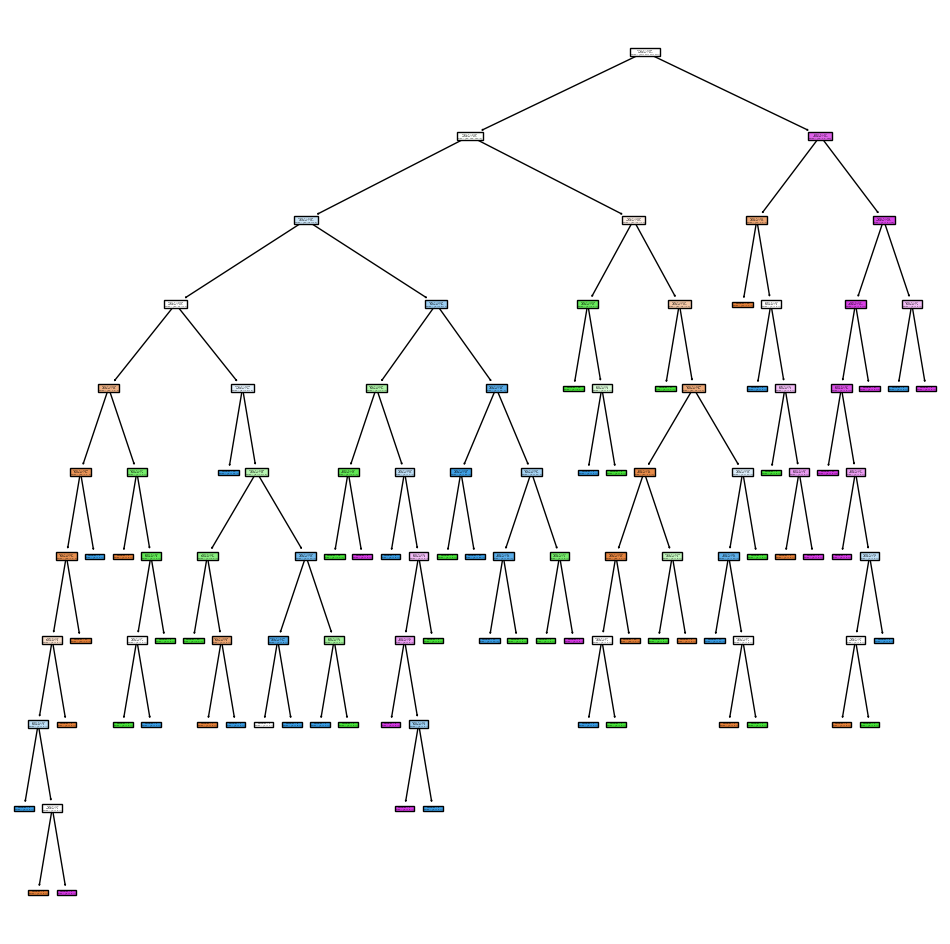

In [46]:
from sklearn import tree
plt.figure(figsize=(12,12))
tree.plot_tree(clf,filled=True)
plt.savefig('tree.png')

In [47]:
clf.score(X,y)


0.9977272727272727

In [48]:
model=SVC()
model.fit(X_train,y_train)
print(f' Training Accuracy is:- {model.score(X_train,y_train)}')
f'Test Accuracy is:- {model.score(X_test,y_test)}'

 Training Accuracy is:- 0.9318181818181818


'Test Accuracy is:- 0.8227272727272728'

K Means Cluster

In [49]:
X.head()

,Age,Gender,Education,Live with,Motive about drug,Spend most time,Failure in life,Mental/emotional problem,Suicidal thoughts,Family relationship,...,Addicted person in family,Withdrawal symptoms,Satisfied with workplace,Case in court,Living with drug user,Smoking,Ever taken drug,Friends influence,If chance given to taste drugs,Easy to control use of drug
0,2.0,1.0,4.0,2.0,1.0,3.0,1.0,1.0,1.0,1.0,...,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0
1,2.0,1.0,3.0,1.0,3.0,2.0,1.0,1.0,2.0,1.0,...,2.0,1.0,2.0,2.0,2.0,1.0,1.0,1.0,3.0,1.0
2,1.0,1.0,3.0,1.0,1.0,2.0,1.0,1.0,1.0,2.0,...,2.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0
3,2.0,1.0,4.0,1.0,2.0,2.0,1.0,1.0,2.0,2.0,...,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0
4,2.0,1.0,4.0,1.0,2.0,3.0,2.0,1.0,2.0,1.0,...,2.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0


Text(0, 0.5, 'Education')

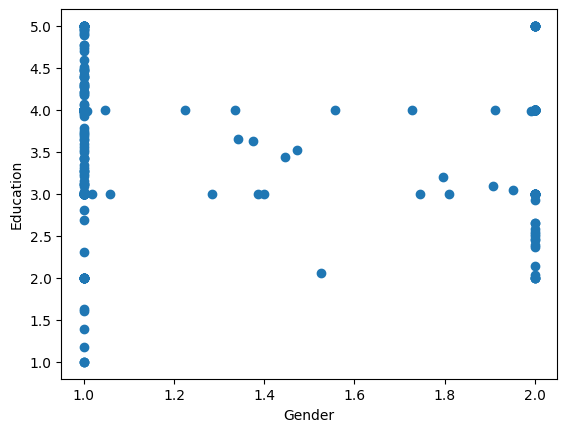

In [50]:
plt.scatter(df.Gender, df.Education)
plt.xlabel('Gender')
plt.ylabel('Education')

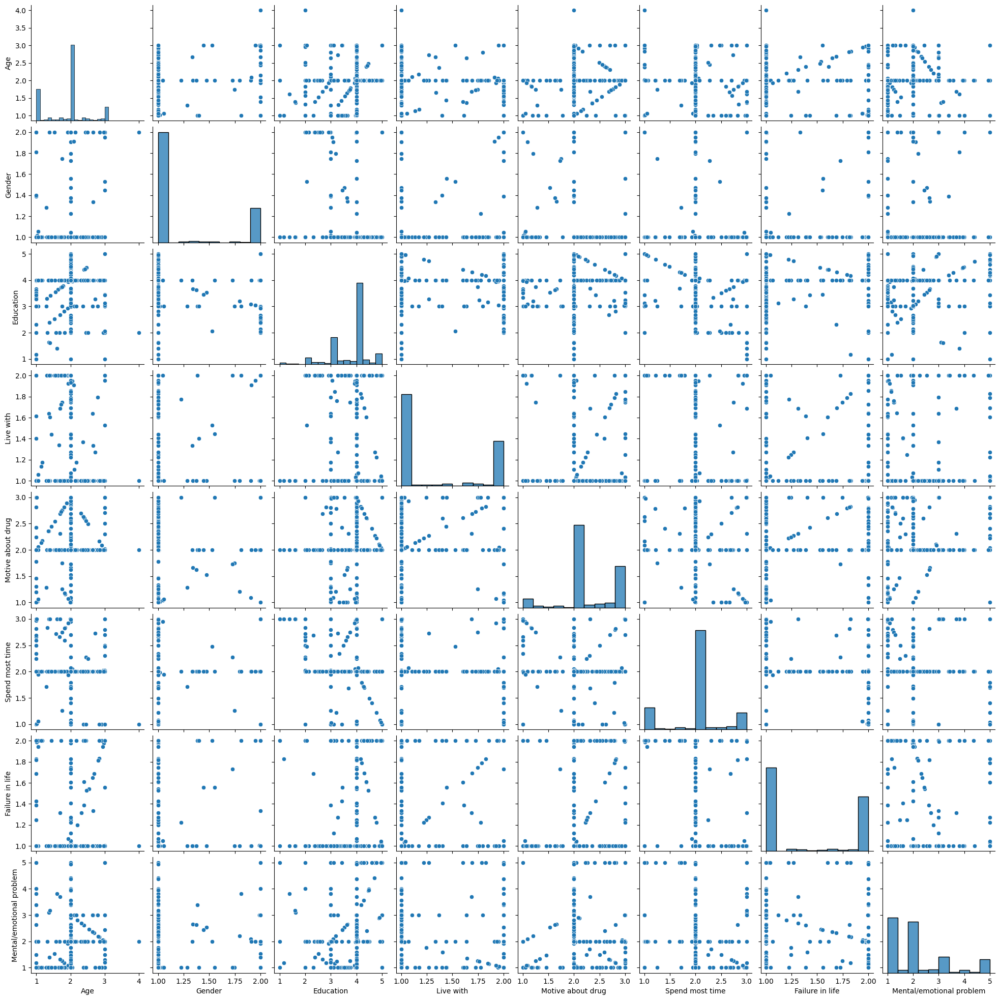

In [51]:
sns.pairplot(df[['Age','Gender','Education','Live with','Motive about drug','Spend most time','Failure in life','Mental/emotional problem']])

In [52]:
import sklearn.cluster as cluster 

In [61]:
from sklearn.cluster import KMeans
wcss = []

cluster = range(1,15)
for k in cluster:
    km = KMeans(n_clusters=k)
    km.fit(df[['Age','Gender','Education','Live with','Motive about drug','Spend most time','Failure in life','Mental/emotional problem','Suicidal thoughts', 'Family relationship', 'Addicted person in family',	'Withdrawal symptoms'	,'Satisfied with workplace','Case in court','Living with drug user'	,'Smoking','Ever taken drug','Friends influence', 'If chance given to taste drugs'	,'Easy to control use of drug','Class']])
    wcss.append(km.inertia_)

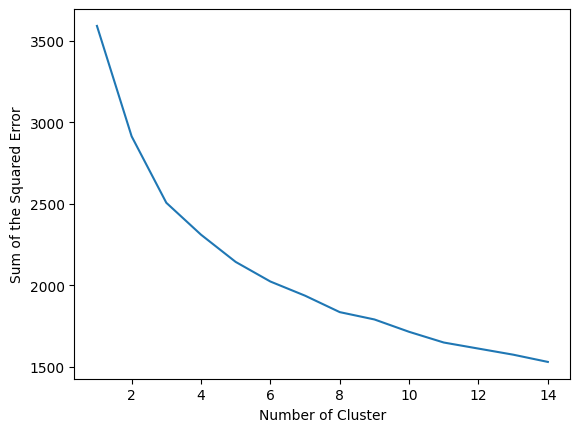

In [62]:
plt.xlabel('Number of Cluster')
plt.ylabel('Sum of the Squared Error')

plt.plot(cluster,wcss)

In [53]:
kmeans = cluster.KMeans(n_clusters = 5)

In [54]:
predicted_cluster = kmeans.fit_predict(df[['Age','Gender','Education','Live with','Motive about drug','Spend most time','Failure in life','Mental/emotional problem','Suicidal thoughts', 'Family relationship', 'Addicted person in family',	'Withdrawal symptoms'	,'Satisfied with workplace','Case in court','Living with drug user'	,'Smoking','Ever taken drug','Friends influence', 'If chance given to taste drugs'	,'Easy to control use of drug','Class']])
predicted_cluster

array([2, 0, 2, 2, 0, 0, 0, 0, 0, 3, 2, 1, 1, 1, 4, 1, 1, 2, 0, 0, 2, 1,
       1, 4, 4, 0, 0, 1, 0, 4, 4, 4, 4, 4, 4, 4, 4, 0, 0, 0, 0, 1, 1, 1,
       1, 2, 4, 1, 1, 1, 2, 4, 0, 1, 1, 0, 0, 1, 4, 4, 4, 4, 0, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 4, 1, 1, 1, 2, 3, 2, 0, 0, 4, 2, 2, 0, 0,
       1, 2, 2, 2, 0, 2, 2, 2, 0, 2, 1, 1, 2, 2, 0, 2, 2, 1, 3, 2, 3, 3,
       0, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 2, 3, 0, 3, 2, 2, 0,
       1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 3, 4, 4, 4, 4, 4, 4, 3, 1,
       2, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 2, 2, 2, 3, 2, 2, 2, 4, 4,
       4, 2, 4, 3, 2, 3, 4, 2, 2, 2, 4, 2, 2, 2, 2, 2, 4, 4, 2, 2, 3, 3,
       2, 2, 2, 2, 4, 2, 2, 4, 2, 3, 2, 3, 2, 2, 2, 2, 3, 2, 4, 2, 3, 2,
       2, 2, 3, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 3, 2, 2, 2,
       2, 2, 4, 2, 2, 2, 4, 2, 2, 3, 2, 2, 2, 2, 4,

In [55]:
df['predicted_cluster'] = predicted_cluster
df

,Age,Gender,Education,Live with,Motive about drug,Spend most time,Failure in life,Mental/emotional problem,Suicidal thoughts,Family relationship,...,Satisfied with workplace,Case in court,Living with drug user,Smoking,Ever taken drug,Friends influence,If chance given to taste drugs,Easy to control use of drug,Class,predicted_cluster
0,2.000000,1.000000,4.0,2.000000,1.00000,3.0,1.0,1.000000,1.000000,1.00000,...,2.00000,2.0,1.000000,1.000000,1.000000,1.000000,1.0,1.000000,2,2
1,2.000000,1.000000,3.0,1.000000,3.00000,2.0,1.0,1.000000,2.000000,1.00000,...,2.00000,2.0,2.000000,1.000000,1.000000,1.000000,3.0,1.000000,3,0
2,1.000000,1.000000,3.0,1.000000,1.00000,2.0,1.0,1.000000,1.000000,2.00000,...,2.00000,1.0,1.000000,1.000000,1.000000,1.000000,1.0,2.000000,2,2
3,2.000000,1.000000,4.0,1.000000,2.00000,2.0,1.0,1.000000,2.000000,2.00000,...,1.00000,2.0,1.000000,1.000000,1.000000,1.000000,1.0,1.000000,2,2
4,2.000000,1.000000,4.0,1.000000,2.00000,3.0,2.0,1.000000,2.000000,1.00000,...,1.00000,2.0,2.000000,1.000000,2.000000,2.000000,2.0,1.000000,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
435,2.000000,1.000000,4.0,2.000000,2.00000,2.0,2.0,4.934642,2.000000,1.00000,...,1.00000,2.0,1.032679,1.000000,1.000000,1.967321,1.0,1.000000,3,4
436,1.000000,1.400013,3.0,1.400013,2.00000,2.0,2.0,1.000000,1.400013,2.00000,...,1.00000,2.0,1.000000,1.400013,1.000000,1.000000,1.0,1.400013,3,0
437,2.969459,2.000000,4.0,1.000000,2.00000,2.0,1.0,2.000000,1.969459,2.00000,...,1.00000,1.0,1.000000,2.000000,1.969459,1.000000,2.0,1.000000,3,3
438,2.140395,2.000000,4.0,1.000000,2.00000,2.0,1.0,2.000000,1.140395,2.00000,...,1.00000,1.0,1.000000,2.000000,1.140395,1.000000,2.0,1.000000,3,3


In [56]:
kmeans.cluster_centers_

array([[1.81397392, 1.03596548, 3.90392771, 1.28687137, 2.38034424,
        1.91912326, 1.54879628, 1.52358065, 1.66892962, 1.39048821,
        1.8223186 , 1.36520926, 1.32409476, 1.92955704, 1.5460527 ,
        1.07396311, 1.1940873 , 1.53659754, 1.63907522, 1.18706831,
        2.92727273],
       [1.56470588, 1.55558331, 3.90588235, 1.43265199, 2.67058824,
        1.74117647, 1.52028919, 1.74117647, 1.74117647, 1.22617154,
        1.91764706, 1.37647059, 1.34117647, 2.        , 1.85882353,
        2.71500493, 1.95294118, 1.89147552, 2.20912257, 1.23529412,
        3.96470588],
       [1.89947541, 1.07483659, 3.55039862, 1.2323036 , 1.94269822,
        2.18482469, 1.1865003 , 1.67220222, 1.58330202, 2.09503341,
        2.13189463, 1.39615173, 1.66450467, 1.72044211, 1.15619307,
        1.02035462, 1.03819788, 1.24348265, 1.03939442, 1.41730865,
        1.37096774],
       [2.40713359, 1.65998962, 3.19465521, 1.39764136, 2.00570728,
        2.06659103, 1.24348631, 2.28831878, 1.2925170